# Feature extraction

Using pyRadiomics package to extract features from MRI images

In [15]:
from __future__ import print_function
import sys
import os
import six
from radiomics import featureextractor, getFeatureClasses
import radiomics
import SimpleITK as sitk
import matplotlib.pyplot as plt
import pandas as pd
import traceback
from scipy.stats import pearsonr
import numpy as np

## Define functions

In [16]:
# Configure Settings
dataset = "training" # Choose from: ["training", "validation", "test"] -- this will determine which dataset to use
Filter = "SquareRoot" # Choose from: ["Original", "SquareRoot", "Wavelet", "LoG", "Square", "Exponential", "Logarithm"]
Store_Original = False # Choose from: [True, False] 
acquisitions = ["T1","T2","DTI_eddy_FA", "FLAIR", "SWI", "DWI", "T1_contrast", "DTI_eddy_MD", "ADC", "ASL"] # choose modalities from: ["T1","T2","DTI_eddy_FA", "FLAIR", "SWI", "DWI", "T1_contrast", "DTI_eddy_MD", "ADC", "ASL"]

Processing T1 image for patient 491
Error for patient 491: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0491_nifti/UCSF-PDGM-0491_T1_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    ret

Error for patient 489: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0489_nifti/UCSF-PDGM-0489_T1_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execu

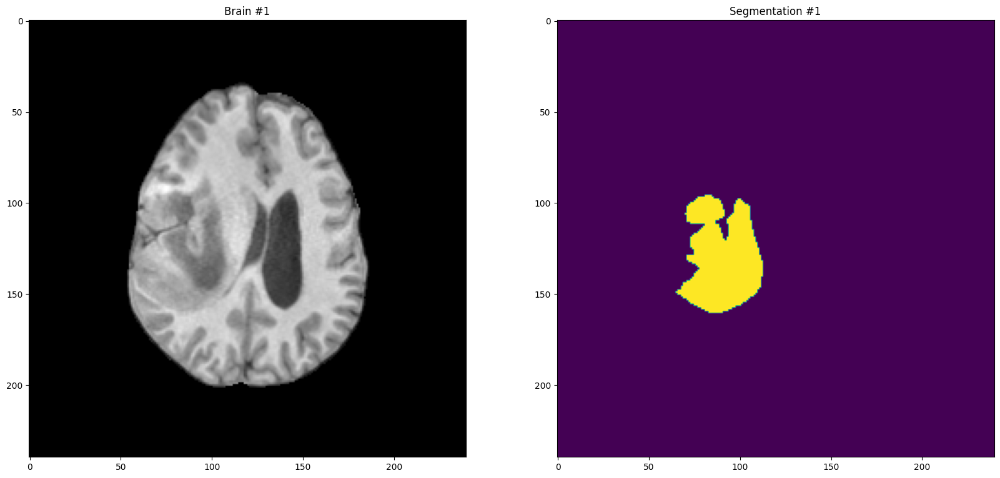

Could not extract features for patient 440 retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	SquareRoot
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'SquareRoot': {}}
Computed diagnostics_Image-original_Hash: a7682d690399467eb127e09cf2713987f6fe4285
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-o

Error for patient 242: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0242_nifti/UCSF-PDGM-0242_T1_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execu

Error for patient 297: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0297_nifti/UCSF-PDGM-0297_T2_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execu

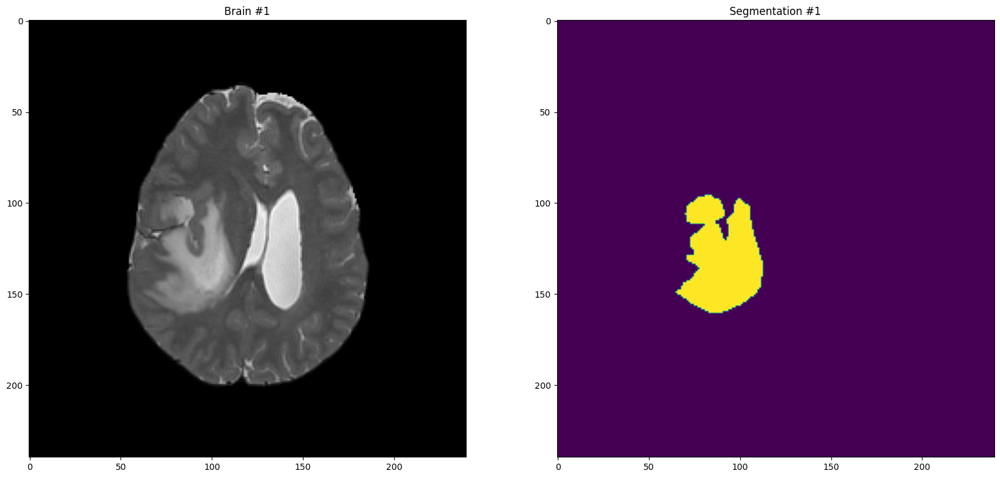

Could not extract features for patient 440 retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	SquareRoot
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'SquareRoot': {}}
Computed diagnostics_Image-original_Hash: b6170b05545b4a3dcc9b3f456381ec34ab305323
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-o

Error for patient 398: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0398_nifti/UCSF-PDGM-0398_T2_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execu

Error for patient 106: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0106_nifti/UCSF-PDGM-0106_DTI_eddy_FA.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_E

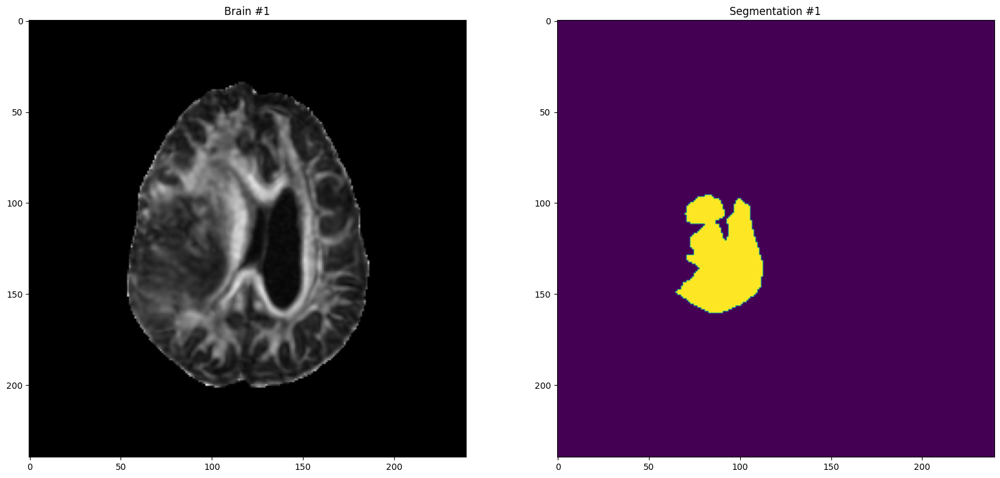

Could not extract features for patient 440 retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	SquareRoot
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'SquareRoot': {}}
Computed diagnostics_Image-original_Hash: 1af6e34420f9439d8611a9ae27e2f2b5afaf90fd
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-o

Error for patient 442: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0442_nifti/UCSF-PDGM-0442_DTI_eddy_FA.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_E

Error for patient 166: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0166_nifti/UCSF-PDGM-0166_FLAIR_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Ex

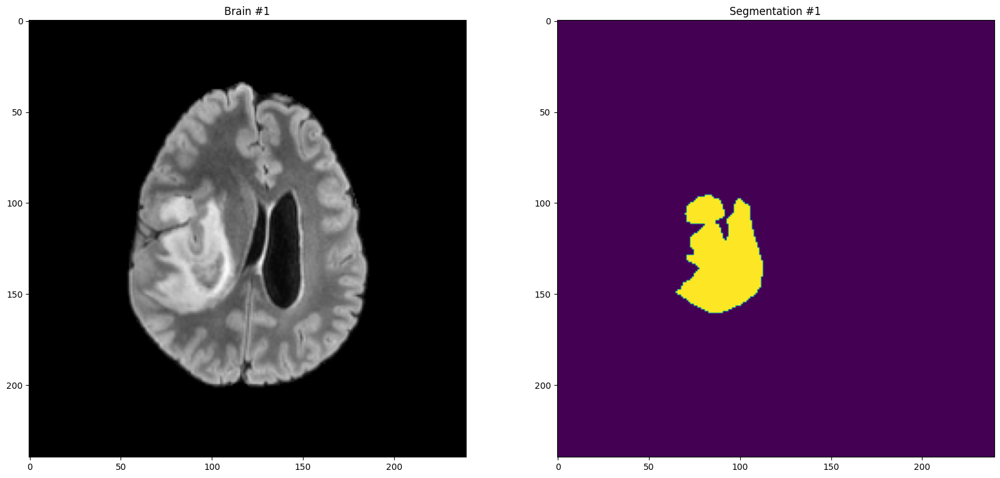

Could not extract features for patient 440 retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	SquareRoot
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'SquareRoot': {}}
Computed diagnostics_Image-original_Hash: 54dc04f6a056eb5727a4c38d615cb45cf91393d2
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-o

Error for patient 309: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0309_nifti/UCSF-PDGM-0309_FLAIR_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Ex

Error for patient 70: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0070_nifti/UCSF-PDGM-0070_SWI.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(se

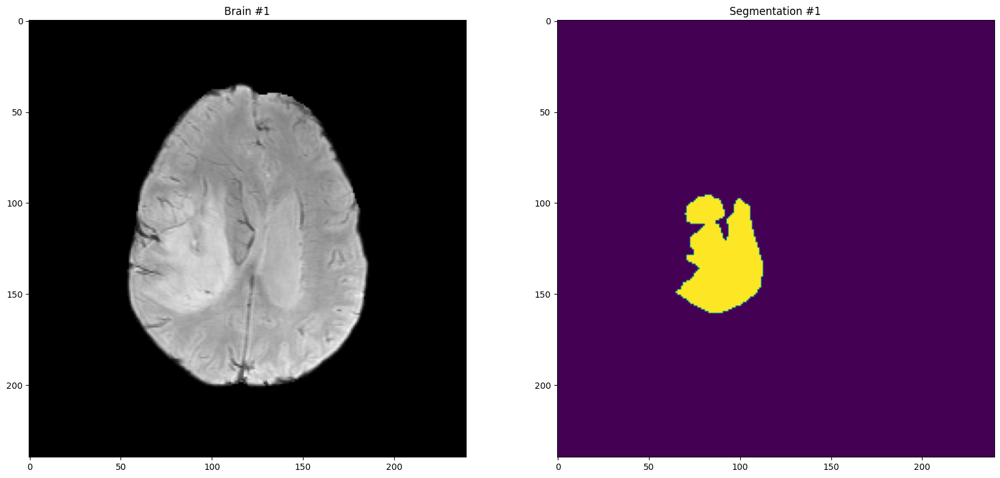

Could not extract features for patient 440 retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	SquareRoot
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'SquareRoot': {}}
Computed diagnostics_Image-original_Hash: 93208dbf30db42f0b801b146a1cfa178841e669f
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-o

Error for patient 398: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0398_nifti/UCSF-PDGM-0398_SWI.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(s

Error for patient 30: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0030_nifti/UCSF-PDGM-0030_DWI_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execu

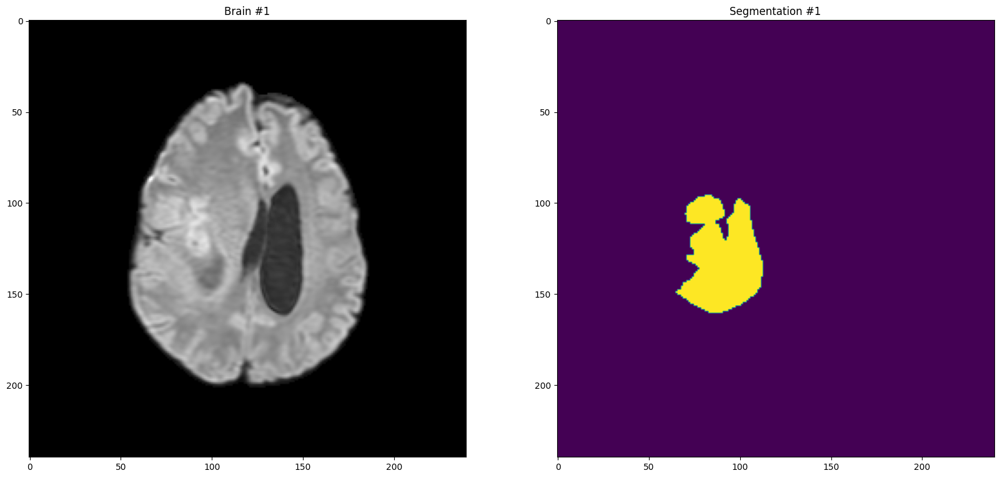

Could not extract features for patient 440 retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	SquareRoot
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'SquareRoot': {}}
Computed diagnostics_Image-original_Hash: 2048c1a1b52e9b3919fe588e8afda0ab1815202d
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-o

Error for patient 342: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0342_nifti/UCSF-PDGM-0342_DWI_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Exec

Error for patient 99: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0099_nifti/UCSF-PDGM-0099_T1c_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execu

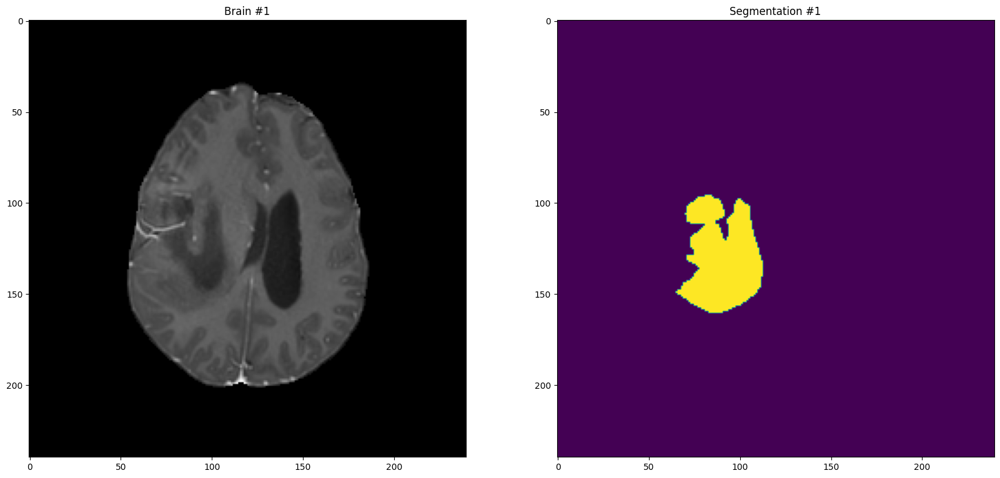

Could not extract features for patient 440 retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	SquareRoot
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'SquareRoot': {}}
Computed diagnostics_Image-original_Hash: 99eed3e1f31c9e3b46ec58438315c3b1ea01d538
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-o

Error for patient 429: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0429_nifti/UCSF-PDGM-0429_T1c_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Exec

Error for patient 454: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0454_nifti/UCSF-PDGM-0454_DTI_eddy_MD.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_E

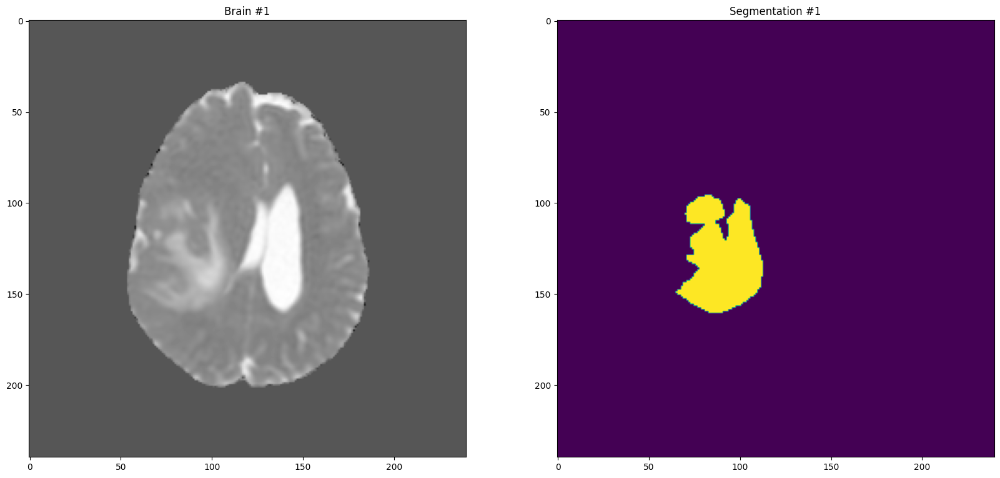

Could not extract features for patient 440 retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	SquareRoot
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'SquareRoot': {}}
Computed diagnostics_Image-original_Hash: 1f967fa4ea27ddcf97d3e77467d02bbeae5fa10d
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-o

Error for patient 305: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0305_nifti/UCSF-PDGM-0305_DTI_eddy_MD.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_E

Error for patient 18: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0018_nifti/UCSF-PDGM-0018_ADC.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(se

Error for patient 353: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0353_nifti/UCSF-PDGM-0353_ADC.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(s

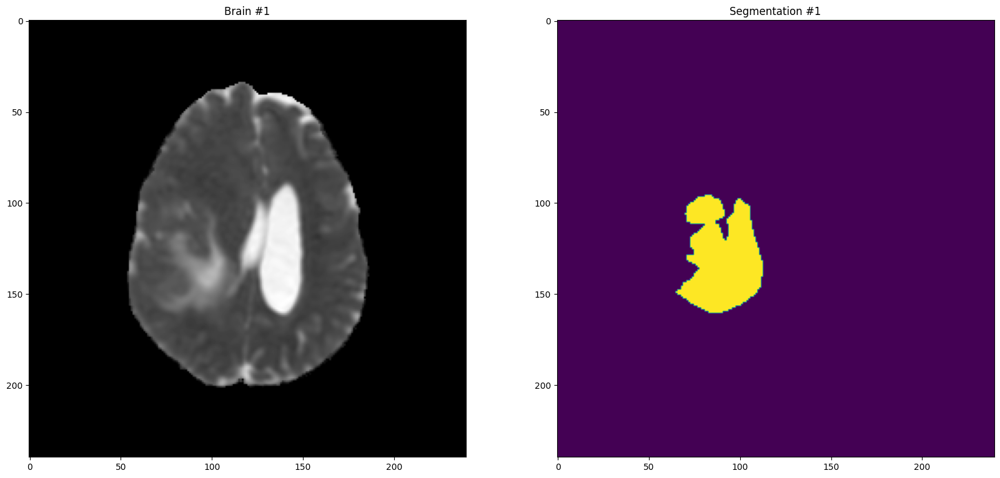

Could not extract features for patient 440 retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	SquareRoot
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'SquareRoot': {}}
Computed diagnostics_Image-original_Hash: 4f96b62c613c0e5d0531136d0dedb5112e634597
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-o

Error for patient 150: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0150_nifti/UCSF-PDGM-0150_ADC.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(s

Error for patient 338: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0338_nifti/UCSF-PDGM-0338_ASL.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(s

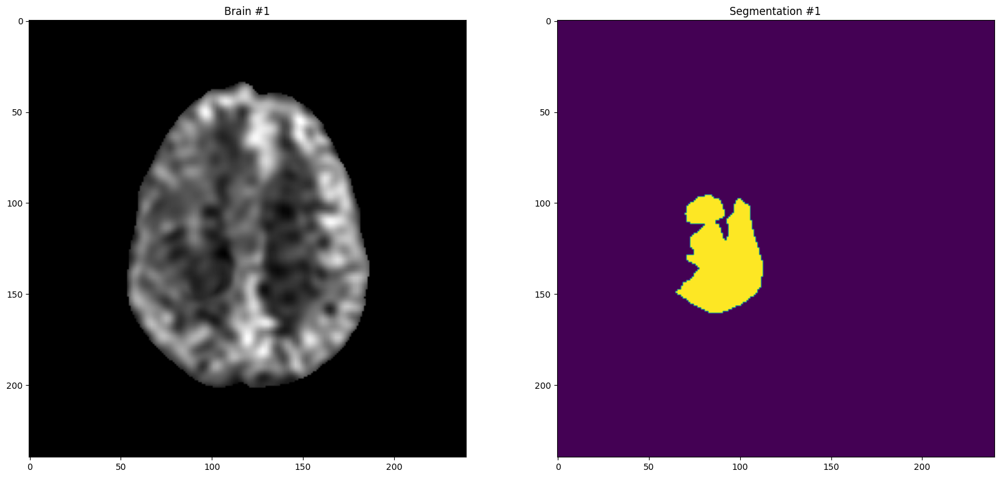

Could not extract features for patient 440 retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	SquareRoot
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'SquareRoot': {}}
Computed diagnostics_Image-original_Hash: d75bd7b8e301e6e1e037666d0ed1ff6c17408469
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-o

Error for patient 67: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0067_nifti/UCSF-PDGM-0067_ASL.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(se

Error for patient 129: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0129_nifti/UCSF-PDGM-0129_ASL.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 135, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3049768861.py", line 18, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(s

In [17]:
def get_settings():
    environment = os.environ.get('PYRADIOMICS_ENV', 'local')  # Default to 'local' if the environment variable is not set

    if environment == 'local':
        base_dir = "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/"
        params = "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Params.yaml"
        train_df = pd.read_csv("/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Training/" + dataset + "_data.csv") 
    elif environment == 'cluster':
        base_dir = "/cluster/project2/UCSF_PDGM_dataset/UCSF-PDGM-v3/"
        params = "/home/goliveir/pyRadiomics/Params.yaml"
        train_df = pd.read_csv("/home/goliveir/pyRadiomics/" + dataset + "_data.csv") 
    else:
        raise ValueError("Unknown environment: please set PYRADIOMICS_ENV to 'local' or 'cluster'")

    return base_dir, params, train_df, environment

def read_image_and_label(image_path, label_path, patient_id):
    Image = sitk.ReadImage(image_path)
    Label = sitk.ReadImage(label_path)

    if Image is None or Label is None:
        raise Exception(f"Error getting data for patient {patient_id}!")

    return Image, Label

def extract_features(params, Image, Label, patient_id):
    try:
        extractor = featureextractor.RadiomicsFeatureExtractor(params)
        result = extractor.execute(Image, Label)  
        return extractor, result
    except Exception as e:
        print(f"Could not extract features for patient {patient_id} retrying with label-value=2")
        settings = {'label': 2}
        extractor = radiomics.featureextractor.RadiomicsFeatureExtractor(additionalInfo=True, **settings)
        result = extractor.execute(Image, Label)  
        return extractor, result
    

def apply_filters_on_images(extractor):

    # By default, only 'Original' (no filter applied) is enabled. Optionally enable some image types:

    filter_types = {
        "SquareRoot": 'SquareRoot',
        "Wavelet": 'Wavelet',
        "LoG": 'LoG',
        "Square": 'Square',
        "Exponential": 'Exponential',
        "Logarithm": 'Logarithm'
    }

    for filter_type, filter_name in filter_types.items():
        if Filter == filter_type:
            extractor.enableImageTypeByName(filter_name)
    
    print('Filters applied on the image:')
    for imageType in extractor.enabledImagetypes.keys():
        print('\t' + imageType)

    return extractor

def calculate_features(extractor, Image, Label):
    extractor.disableAllFeatures() # These 2 lines will cause only firstorder features to be calculated
    extractor.enableFeatureClassByName('firstorder') 
    featureVector = extractor.execute(Image, Label)
    
    # Show calculated features
    print('Calculated features:')
    for featureName in featureVector.keys():
        print('Computed %s: %s' % (featureName, featureVector[featureName]))
    return featureVector

def fetch_data(base_dir, patient_id, img_type):
    folder_name = f"UCSF-PDGM-{patient_id:04d}_nifti"
    data_dir = os.path.join(base_dir, folder_name)
    
    image_types = {
        "DTI_eddy_FA": "_DTI_eddy_FA.nii.gz",
        "FLAIR": "_FLAIR_bias.nii.gz",
        "SWI": "_SWI.nii.gz",
        "T1": "_T1_bias.nii.gz",
        "T2": "_T2_bias.nii.gz",
        "DWI": "_DWI_bias.nii.gz",
        "T1_contrast": "_T1c_bias.nii.gz",
        "DTI_eddy_MD": "_DTI_eddy_MD.nii.gz",
        "ADC": "_ADC.nii.gz",
        "ASL": "_ASL.nii.gz"
    } 
    
    if img_type in image_types:
        print(f"Processing {img_type} image for patient {patient_id}")
        image_filename = f"UCSF-PDGM-{patient_id:04d}{image_types[img_type]}"
        image_path = os.path.join(data_dir, image_filename)
    else:
        print(f"Unknown image type: {img_type}")
        image_path = None
    
    label_filename = f"UCSF-PDGM-{patient_id:04d}_tumor_segmentation.nii.gz"
    label_path = os.path.join(data_dir, label_filename)
    
    return image_path, label_path

def view_data(Image, Label):
    plt.figure(figsize=(20,20))
    plt.subplot(2,2,1)
    plt.imshow(sitk.GetArrayFromImage(Image)[109,:,:], cmap="gray")
    plt.title("Brain #1")
    plt.subplot(2,2,2)
    plt.imshow(sitk.GetArrayFromImage(Label)[109,:,:])        
    plt.title("Segmentation #1")
    plt.show()
    
def main():
    base_dir, params, train_df, environment = get_settings()
    lost_patients = []
    
    for cImg in acquisitions:
        img_type = cImg 
        filter_names = ["sqrroot", "wavelet", "log", "square", "exponential", "logarithm"]
        feature_data = {name: pd.DataFrame() for name in filter_names}

        errors_id = pd.DataFrame()
        count = 0

        for _, row in train_df.iterrows():
            patient_id_str = row[0]  # Assuming the patient ID is in the first column
            patient_id = int(patient_id_str.split("-")[-1])
            image_path, label_path = fetch_data(base_dir, patient_id, img_type)

            try:
                Image, Label = read_image_and_label(image_path, label_path, patient_id)
                if environment == 'local': view_data(Image, Label)
                extractor, result = extract_features(params, Image, Label, patient_id) # Here it goes wrong if label < 3
                extractor = apply_filters_on_images(extractor)
                featureVector = calculate_features(extractor, Image, Label)
                
                if Filter == "SquareRoot":
                    sqrroot_features = {key: value for key, value in featureVector.items() if key.startswith('squareroot_firstorder_')}
                    feature_data_sqrroot = feature_data_sqrroot.append(pd.DataFrame(sqrroot_features, index=[patient_id]))

                if Filter == "Wavelet":
                    wavelet_features = {key: value for key, value in featureVector.items() if key.startswith('wavelet_firstorder_')}
                    feature_data_wavelet = feature_data_wavelet.append(pd.DataFrame(wavelet_features, index=[patient_id]))

                if Filter == "LoG":
                    log_features = {key: value for key, value in featureVector.items() if key.startswith('logarithm_firstorder_')}
                    feature_data_log = feature_data_log.append(pd.DataFrame(log_features, index=[patient_id]))

                if Filter == "Square":
                    square_features = {key: value for key, value in featureVector.items() if key.startswith('square_firstorder_')}
                    feature_data_square = feature_data_square.append(pd.DataFrame(square_features, index=[patient_id]))

                if Filter == "Exponential":
                    exponential_features = {key: value for key, value in featureVector.items() if key.startswith('exponential_firstorder_')}
                    feature_data_exponential = feature_data_exponential.append(pd.DataFrame(exponential_features, index=[patient_id]))

                if Filter == "Logarithm":
                    logarithm_features = {key: value for key, value in featureVector.items() if key.startswith('logarithm_firstorder_')}
                    feature_data_logarithm = feature_data_logarithm.append(pd.DataFrame(logarithm_features, index=[patient_id]))
    
                feature_data = feature_data.append(pd.DataFrame(first_order_features, index=[patient_id]))

            except Exception as e:
                count += 1
                tb_str = traceback.format_exception(etype=type(e), value=e, tb=e.__traceback__)
                tb_str = ''.join(tb_str)
                print(f"Error for patient {patient_id}: {str(e)}\nTraceback:\n{tb_str}")
                lost_patients.append(patient_id)

        print(f'Number of errors occurred: {count} --> patients affected by error {set(lost_patients)}')
        # Save the feature_data DataFrame as a CSV file in the base_dir
        if Store_Original == True:
            feature_data.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_original_{img_type}.csv"))    

        if Filter == "SquareRoot":
            feature_data_sqrroot.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_sqrroot_{img_type}.csv"))

        if Filter == "Wavelet":
            feature_data_wavelet.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_wavelet_{img_type}.csv"))
        
        if Filter == "LoG":
            feature_data_log.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_log_{img_type}.csv"))
        
        if Filter == "Square":
            feature_data_square.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_square_{img_type}.csv"))
        
        if Filter == "Exponential":
            feature_data_exponential.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_exponential_{img_type}.csv"))
        
        if Filter == "Logarithm":
            feature_data_logarithm.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_logarithm_{img_type}.csv"))
            
if __name__ == "__main__":
    main()








In [22]:
from __future__ import print_function
import sys
import os
import six
from radiomics import featureextractor, getFeatureClasses
import radiomics
import SimpleITK as sitk
import pandas as pd
import traceback
from scipy.stats import pearsonr
import numpy as np

# Configure Settings
dataset = "training" # Choose from: ["training", "validation", "test"] -- this will determine which dataset to use
Filter = "Wavelet" # Choose from: ["Original", "SquareRoot", "Wavelet", "LoG", "Square", "Exponential", "Logarithm"]
Store_Original = False # Choose from: [True, False] 
# choose modalities from: ["T1","T2","DTI_eddy_FA", "FLAIR", "SWI", "DWI", "T1_contrast", "DTI_eddy_MD", "ADC", "ASL"]
acquisitions = ["T1","T2","DTI_eddy_FA", "FLAIR", "SWI", "DWI", "T1_contrast", "DTI_eddy_MD", "ADC", "ASL"] 


def get_settings():
    environment = os.environ.get('PYRADIOMICS_ENV', 'local')  # Default to 'local' if the environment variable is not set

    if environment == 'local':
        base_dir = "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/"
        params = "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Params.yaml"
        train_df = pd.read_csv("/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Training/" + dataset + "_data.csv") 
    elif environment == 'cluster':
        base_dir = "/cluster/project2/UCSF_PDGM_dataset/UCSF-PDGM-v3/"
        params = "/home/goliveir/pyRadiomics/Params.yaml"
        train_df = pd.read_csv("/home/goliveir/pyRadiomics/" + dataset + "_data.csv") 
    else:
        raise ValueError("Unknown environment: please set PYRADIOMICS_ENV to 'local' or 'cluster'")

    return base_dir, params, train_df, environment

def read_image_and_label(image_path, label_path, patient_id):
    Image = sitk.ReadImage(image_path)
    Label = sitk.ReadImage(label_path)

    if Image is None or Label is None:
        raise Exception(f"Error getting data for patient {patient_id}!")

    return Image, Label

def extract_features(params, Image, Label, patient_id):
    try:
        extractor = featureextractor.RadiomicsFeatureExtractor(params)
        result = extractor.execute(Image, Label)  
        return extractor, result
    except Exception as e:
        print(f"Could not extract features for patient {patient_id} Reason: {str(e)} \nretrying with label-value=2")
        settings = {'label': 2}
        extractor = radiomics.featureextractor.RadiomicsFeatureExtractor(additionalInfo=True, **settings)
        result = extractor.execute(Image, Label)  
        return extractor, result
    

def apply_filters_on_images(extractor):

    # By default, only 'Original' (no filter applied) is enabled. Optionally enable some image types:

    filter_types = {
        "SquareRoot": 'SquareRoot',
        "Wavelet": 'Wavelet',
        "LoG": 'LoG',
        "Square": 'Square',
        "Exponential": 'Exponential',
        "Logarithm": 'Logarithm'
    }

    for filter_type, filter_name in filter_types.items():
        if Filter == filter_type:
            extractor.enableImageTypeByName(filter_name)
    
    print('Filters applied on the image:')
    for imageType in extractor.enabledImagetypes.keys():
        print('\t' + imageType)

    return extractor

def calculate_features(extractor, Image, Label):
    extractor.disableAllFeatures() # These 2 lines will cause only firstorder features to be calculated
    extractor.enableFeatureClassByName('firstorder') 
    featureVector = extractor.execute(Image, Label)
    
    # Show calculated features
    print('Calculated features:')
    for featureName in featureVector.keys():
        print('Computed %s: %s' % (featureName, featureVector[featureName]))
    return featureVector

def fetch_data(base_dir, patient_id, img_type):
    folder_name = f"UCSF-PDGM-{patient_id:04d}_nifti"
    data_dir = os.path.join(base_dir, folder_name)
    
    image_types = {
        "DTI_eddy_FA": "_DTI_eddy_FA.nii.gz",
        "FLAIR": "_FLAIR_bias.nii.gz",
        "SWI": "_SWI.nii.gz",
        "T1": "_T1_bias.nii.gz",
        "T2": "_T2_bias.nii.gz",
        "DWI": "_DWI_bias.nii.gz",
        "T1_contrast": "_T1c_bias.nii.gz",
        "DTI_eddy_MD": "_DTI_eddy_MD.nii.gz",
        "ADC": "_ADC.nii.gz",
        "ASL": "_ASL.nii.gz"
    } 
    
    if img_type in image_types:
        print(f"Processing {img_type} image for patient {patient_id}")
        image_filename = f"UCSF-PDGM-{patient_id:04d}{image_types[img_type]}"
        image_path = os.path.join(data_dir, image_filename)
    else:
        print(f"Unknown image type: {img_type}")
        image_path = None
    
    label_filename = f"UCSF-PDGM-{patient_id:04d}_tumor_segmentation.nii.gz"
    label_path = os.path.join(data_dir, label_filename)
    
    return image_path, label_path
    
def main():
    base_dir, params, train_df, environment = get_settings()
    lost_patients = []
    
    for cImg in acquisitions:
        img_type = cImg 

        feature_data_sqrroot = pd.DataFrame() # Initialize feature data df
        feature_data_wavelet = pd.DataFrame() # Initialize feature data df
        feature_data_log = pd.DataFrame() # Initialize feature data df
        feature_data_square = pd.DataFrame() # Initialize feature data df
        feature_data_exponential = pd.DataFrame() # Initialize feature data df
        feature_data_logarithm = pd.DataFrame() # Initialize feature data df

        errors_id = pd.DataFrame()
        count = 0

        for _, row in train_df.iterrows():
            patient_id_str = row[0]  # Assuming the patient ID is in the first column
            patient_id = int(patient_id_str.split("-")[-1])
            image_path, label_path = fetch_data(base_dir, patient_id, img_type)

            try:
                Image, Label = read_image_and_label(image_path, label_path, patient_id)
                extractor, result = extract_features(params, Image, Label, patient_id) # Here it goes wrong if label < 3
                extractor = apply_filters_on_images(extractor)
                featureVector = calculate_features(extractor, Image, Label)
                
                # Always store the original features in the feature_data DataFrame
                original_features = {key: value for key, value in featureVector.items() if key.startswith('original_firstorder_')}
                feature_data = feature_data.append(pd.DataFrame(original_features, index=[patient_id]))

                # Additionally, store the filtered features in separate DataFrames
                if Filter == "SquareRoot":
                    sqrroot_features = {key: value for key, value in featureVector.items() if key.startswith('squareroot_firstorder_')}
                    feature_data_sqrroot = feature_data_sqrroot.append(pd.DataFrame(sqrroot_features, index=[patient_id]))

                if Filter == "Wavelet":
                    wavelet_features = {key: value for key, value in featureVector.items() if key.startswith('wavelet_firstorder_')}
                    feature_data_wavelet = feature_data_wavelet.append(pd.DataFrame(wavelet_features, index=[patient_id]))

                if Filter == "LoG":
                    log_features = {key: value for key, value in featureVector.items() if key.startswith('logarithm_firstorder_')}
                    feature_data_log = feature_data_log.append(pd.DataFrame(log_features, index=[patient_id]))

                if Filter == "Square":
                    square_features = {key: value for key, value in featureVector.items() if key.startswith('square_firstorder_')}
                    feature_data_square = feature_data_square.append(pd.DataFrame(square_features, index=[patient_id]))

                if Filter == "Exponential":
                    exponential_features = {key: value for key, value in featureVector.items() if key.startswith('exponential_firstorder_')}
                    feature_data_exponential = feature_data_exponential.append(pd.DataFrame(exponential_features, index=[patient_id]))

                if Filter == "Logarithm":
                    logarithm_features = {key: value for key, value in featureVector.items() if key.startswith('logarithm_firstorder_')}
                    feature_data_logarithm = feature_data_logarithm.append(pd.DataFrame(logarithm_features, index=[patient_id]))
    
            except Exception as e:
                count += 1
                tb_str = traceback.format_exception(etype=type(e), value=e, tb=e.__traceback__)
                tb_str = ''.join(tb_str)
                print(f"Error for patient {patient_id}: {str(e)}\nTraceback:\n{tb_str}")
                lost_patients.append(patient_id)

        print(f'Number of errors occurred: {count} --> patients affected by error {set(lost_patients)}')
        
        # Save the feature_data DataFrame as a CSV file in the base_dir
        if Store_Original == True:
            feature_data.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_original_{img_type}.csv"))    

        if Filter == "SquareRoot":
            feature_data_sqrroot.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_sqrroot_{img_type}.csv"))

        if Filter == "Wavelet":
            feature_data_wavelet.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_wavelet_{img_type}.csv"))
        
        if Filter == "LoG":
            feature_data_log.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_log_{img_type}.csv"))
        
        if Filter == "Square":
            feature_data_square.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_square_{img_type}.csv"))
        
        if Filter == "Exponential":
            feature_data_exponential.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_exponential_{img_type}.csv"))
        
        if Filter == "Logarithm":
            feature_data_logarithm.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_logarithm_{img_type}.csv"))
            
        
if __name__ == "__main__":
    main()








Processing T1 image for patient 491
Error for patient 491: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0491_nifti/UCSF-PDGM-0491_T1_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    ret

Error for patient 517: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0517_nifti/UCSF-PDGM-0517_T1_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execu

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Wavelet
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Wavelet': {}}
Computed diagnostics_Image-original_Hash: a7682d690399467eb127e09cf2713987f6fe4285
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-origina

Processing T1 image for patient 385
Error for patient 385: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0385_nifti/UCSF-PDGM-0385_T1_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    ret

Error for patient 464: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0464_nifti/UCSF-PDGM-0464_T2_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execu

Could not extract features for patient 440 Reason: Label (1) not present in mask. Choose from [2] 
retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Wavelet
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Wavelet': {}}
Computed diagnostics_Image-original_Hash: b6170b05545b4a3dcc9b3f456381ec34ab305323
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-origina

Processing T2 image for patient 63
Error for patient 63: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0063_nifti/UCSF-PDGM-0063_T2_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    retur

Error for patient 66: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0066_nifti/UCSF-PDGM-0066_DTI_eddy_FA.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Ex

Could not extract features for patient 440 Reason: Label (1) not present in mask. Choose from [2] 
retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Wavelet
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Wavelet': {}}
Computed diagnostics_Image-original_Hash: 1af6e34420f9439d8611a9ae27e2f2b5afaf90fd
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-origina

Error for patient 308: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0308_nifti/UCSF-PDGM-0308_DTI_eddy_FA.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_E

Error for patient 276: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0276_nifti/UCSF-PDGM-0276_FLAIR_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Ex

Error for patient 407: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0407_nifti/UCSF-PDGM-0407_FLAIR_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Ex

Could not extract features for patient 440 Reason: Label (1) not present in mask. Choose from [2] 
retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Wavelet
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Wavelet': {}}
Computed diagnostics_Image-original_Hash: 54dc04f6a056eb5727a4c38d615cb45cf91393d2
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-origina

Error for patient 132: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0132_nifti/UCSF-PDGM-0132_FLAIR_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Ex

Error for patient 44: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0044_nifti/UCSF-PDGM-0044_FLAIR_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Exe

Error for patient 264: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0264_nifti/UCSF-PDGM-0264_SWI.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(s

Error for patient 10: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0010_nifti/UCSF-PDGM-0010_SWI.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(se

Could not extract features for patient 440 Reason: Label (1) not present in mask. Choose from [2] 
retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Wavelet
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Wavelet': {}}
Computed diagnostics_Image-original_Hash: 93208dbf30db42f0b801b146a1cfa178841e669f
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-origina

Error for patient 180: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0180_nifti/UCSF-PDGM-0180_SWI.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(s

Error for patient 251: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0251_nifti/UCSF-PDGM-0251_DWI_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Exec

Could not extract features for patient 440 Reason: Label (1) not present in mask. Choose from [2] 
retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Wavelet
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Wavelet': {}}
Computed diagnostics_Image-original_Hash: 2048c1a1b52e9b3919fe588e8afda0ab1815202d
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-origina

Error for patient 487: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0487_nifti/UCSF-PDGM-0487_DWI_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Exec

Error for patient 405: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0405_nifti/UCSF-PDGM-0405_T1c_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Exec

Could not extract features for patient 440 Reason: Label (1) not present in mask. Choose from [2] 
retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Wavelet
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Wavelet': {}}
Computed diagnostics_Image-original_Hash: 99eed3e1f31c9e3b46ec58438315c3b1ea01d538
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-origina

Error for patient 417: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0417_nifti/UCSF-PDGM-0417_T1c_bias.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Exec

Error for patient 495: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0495_nifti/UCSF-PDGM-0495_DTI_eddy_MD.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_E

Could not extract features for patient 440 Reason: Label (1) not present in mask. Choose from [2] 
retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Wavelet
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Wavelet': {}}
Computed diagnostics_Image-original_Hash: 1f967fa4ea27ddcf97d3e77467d02bbeae5fa10d
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-origina

Error for patient 150: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0150_nifti/UCSF-PDGM-0150_DTI_eddy_MD.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_E

Error for patient 423: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0423_nifti/UCSF-PDGM-0423_ADC.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(s

Could not extract features for patient 440 Reason: Label (1) not present in mask. Choose from [2] 
retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Wavelet
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Wavelet': {}}
Computed diagnostics_Image-original_Hash: 4f96b62c613c0e5d0531136d0dedb5112e634597
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-origina

Error for patient 283: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0283_nifti/UCSF-PDGM-0283_ADC.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(s

Error for patient 384: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0384_nifti/UCSF-PDGM-0384_ASL.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(s

Could not extract features for patient 440 Reason: Label (1) not present in mask. Choose from [2] 
retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Wavelet
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Wavelet': {}}
Computed diagnostics_Image-original_Hash: d75bd7b8e301e6e1e037666d0ed1ff6c17408469
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image-origina

Error for patient 413: Exception thrown in SimpleITK ImageFileReader_Execute: /Users/runner/work/1/sitk/Code/IO/src/sitkImageReaderBase.cxx:97:
sitk::ERROR: The file "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/UCSF-PDGM-0413_nifti/UCSF-PDGM-0413_ASL.nii.gz" does not exist.
Traceback:
Traceback (most recent call last):
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 146, in main
    Image, Label = read_image_and_label(image_path, label_path, patient_id)
  File "/var/folders/cp/h8k252jd0zj9_4h7rrs3cw340000gn/T/ipykernel_11579/3669026961.py", line 38, in read_image_and_label
    Image = sitk.ReadImage(image_path)
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/extra.py", line 355, in ReadImage
    return reader.Execute()
  File "/Users/Gabriel/opt/anaconda3/envs/py3.7.0/lib/python3.7/site-packages/SimpleITK/SimpleITK.py", line 8438, in Execute
    return _SimpleITK.ImageFileReader_Execute(s

In [29]:
from __future__ import print_function
import sys
import os
import six
from radiomics import featureextractor, getFeatureClasses
import radiomics
import SimpleITK as sitk
import pandas as pd
import traceback
from scipy.stats import pearsonr
import numpy as np

# Configure Settings
dataset = "training" # Choose from: ["training", "validation", "test"] -- this will determine which dataset to use
Filter = "Exponential" # Choose from: ["Original", "SquareRoot", "Wavelet", "LoG", "Square", "Exponential", "Logarithm"]
Store_Original = False # Choose from: [True, False] 
# choose modalities from: ["T1","T2","DTI_eddy_FA", "FLAIR", "SWI", "DWI", "T1_contrast", "DTI_eddy_MD", "ADC", "ASL"]
acquisitions = ["T1","T2","DTI_eddy_FA", "FLAIR", "SWI", "DWI", "T1_contrast", "DTI_eddy_MD", "ADC", "ASL"] 


def get_settings():
    environment = os.environ.get('PYRADIOMICS_ENV', 'local')  # Default to 'local' if the environment variable is not set

    if environment == 'local':
        base_dir = "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Data/"
        params = "/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Params.yaml"
        train_df = pd.read_csv("/Users/Gabriel/Desktop/MSc_Dissertation/pyRadiomics/Training/" + dataset + "_data.csv") 
    elif environment == 'cluster':
        base_dir = "/cluster/project2/UCSF_PDGM_dataset/UCSF-PDGM-v3/"
        params = "/home/goliveir/pyRadiomics/Params.yaml"
        train_df = pd.read_csv("/home/goliveir/pyRadiomics/" + dataset + "_data.csv") 
    else:
        raise ValueError("Unknown environment: please set PYRADIOMICS_ENV to 'local' or 'cluster'")

    return base_dir, params, train_df, environment

def read_image_and_label(image_path, label_path, patient_id):
    Image = sitk.ReadImage(image_path)
    Label = sitk.ReadImage(label_path)

    if Image is None or Label is None:
        raise Exception(f"Error getting data for patient {patient_id}!")

    return Image, Label

def extract_features(params, Image, Label, patient_id):
    try:
        extractor = featureextractor.RadiomicsFeatureExtractor(params)
        result = extractor.execute(Image, Label)  
        return extractor, result
    except Exception as e:
        print(f"Could not extract features for patient {patient_id} Reason: {str(e)} \nretrying with label-value=2")
        settings = {'label': 2}
        extractor = radiomics.featureextractor.RadiomicsFeatureExtractor(additionalInfo=True, **settings)
        result = extractor.execute(Image, Label)  
        return extractor, result
    

def apply_filters_on_images(extractor):

    # By default, only 'Original' (no filter applied) is enabled. Optionally enable some image types:

    filter_types = {
        "SquareRoot": 'SquareRoot',
        "Wavelet": 'Wavelet',
        "LoG": 'LoG',
        "Square": 'Square',
        "Exponential": 'Exponential',
        "Logarithm": 'Logarithm'
    }

    for filter_type, filter_name in filter_types.items():
        if Filter == filter_type:
            extractor.enableImageTypeByName(filter_name)
    
    print('Filters applied on the image:')
    for imageType in extractor.enabledImagetypes.keys():
        print('\t' + imageType)

    return extractor

def calculate_features(extractor, Image, Label):
    extractor.disableAllFeatures() # These 2 lines will cause only firstorder features to be calculated
    extractor.enableFeatureClassByName('firstorder') 
    featureVector = extractor.execute(Image, Label)
    
    # Show calculated features
    print('Calculated features:')
    for featureName in featureVector.keys():
        print('Computed %s: %s' % (featureName, featureVector[featureName]))
    return featureVector

def fetch_data(base_dir, patient_id, img_type):
    folder_name = f"UCSF-PDGM-{patient_id:04d}_nifti"
    data_dir = os.path.join(base_dir, folder_name)
    
    image_types = {
        "DTI_eddy_FA": "_DTI_eddy_FA.nii.gz",
        "FLAIR": "_FLAIR_bias.nii.gz",
        "SWI": "_SWI.nii.gz",
        "T1": "_T1_bias.nii.gz",
        "T2": "_T2_bias.nii.gz",
        "DWI": "_DWI_bias.nii.gz",
        "T1_contrast": "_T1c_bias.nii.gz",
        "DTI_eddy_MD": "_DTI_eddy_MD.nii.gz",
        "ADC": "_ADC.nii.gz",
        "ASL": "_ASL.nii.gz"
    } 
    
    if img_type in image_types:
        print(f"Processing {img_type} image for patient {patient_id}")
        image_filename = f"UCSF-PDGM-{patient_id:04d}{image_types[img_type]}"
        image_path = os.path.join(data_dir, image_filename)
    else:
        print(f"Unknown image type: {img_type}")
        image_path = None
    
    label_filename = f"UCSF-PDGM-{patient_id:04d}_tumor_segmentation.nii.gz"
    label_path = os.path.join(data_dir, label_filename)
    
    return image_path, label_path
    
def main():
    base_dir, params, train_df, environment = get_settings()
    lost_patients = []
    
    for cImg in acquisitions:
        img_type = cImg 
        
        feature_data = pd.DataFrame() # Initialize feature data df
        feature_data_sqrroot = pd.DataFrame() # Initialize feature data df
        feature_data_wavelet = pd.DataFrame() # Initialize feature data df
        feature_data_log = pd.DataFrame() # Initialize feature data df
        feature_data_square = pd.DataFrame() # Initialize feature data df
        feature_data_exponential = pd.DataFrame() # Initialize feature data df
        feature_data_logarithm = pd.DataFrame() # Initialize feature data df

        errors_id = pd.DataFrame()
        count = 0

        for _, row in train_df.iterrows():
            patient_id_str = row[0]  # Assuming the patient ID is in the first column
            patient_id = int(patient_id_str.split("-")[-1])
            image_path, label_path = fetch_data(base_dir, patient_id, img_type)

            try:
                Image, Label = read_image_and_label(image_path, label_path, patient_id)
                extractor, result = extract_features(params, Image, Label, patient_id) # Here it goes wrong if label < 3
                extractor = apply_filters_on_images(extractor)
                featureVector = calculate_features(extractor, Image, Label)
                
                # Always store the original features in the feature_data DataFrame
                original_features = {key: value for key, value in featureVector.items() if key.startswith('original_firstorder_')}
                feature_data = feature_data.append(pd.DataFrame(original_features, index=[patient_id]))

                # Additionally, store the filtered features in separate DataFrames
                if Filter == "SquareRoot":
                    sqrroot_features = {key: value for key, value in featureVector.items() if key.startswith('squareroot_firstorder_')}
                    feature_data_sqrroot = feature_data_sqrroot.append(pd.DataFrame(sqrroot_features, index=[patient_id]))

                if Filter == "Wavelet":
                    wavelet_features = {key: value for key, value in featureVector.items() if key.startswith('wavelet-LLH_firstorder_')}
                    feature_data_wavelet = feature_data_wavelet.append(pd.DataFrame(wavelet_features, index=[patient_id]))

                if Filter == "LoG":
                    log_features = {key: value for key, value in featureVector.items() if key.startswith('logarithm_firstorder_')}
                    feature_data_log = feature_data_log.append(pd.DataFrame(log_features, index=[patient_id]))

                if Filter == "Square":
                    square_features = {key: value for key, value in featureVector.items() if key.startswith('square_firstorder_')}
                    feature_data_square = feature_data_square.append(pd.DataFrame(square_features, index=[patient_id]))

                if Filter == "Exponential":
                    exponential_features = {key: value for key, value in featureVector.items() if key.startswith('exponential_firstorder_')}
                    feature_data_exponential = feature_data_exponential.append(pd.DataFrame(exponential_features, index=[patient_id]))

                if Filter == "Logarithm":
                    logarithm_features = {key: value for key, value in featureVector.items() if key.startswith('logarithm_firstorder_')}
                    feature_data_logarithm = feature_data_logarithm.append(pd.DataFrame(logarithm_features, index=[patient_id]))
    
            except Exception as e:
                count += 1
                tb_str = traceback.format_exception(etype=type(e), value=e, tb=e.__traceback__)
                tb_str = ''.join(tb_str)
                print(f"Error for patient {patient_id}: {str(e)}\nTraceback:\n{tb_str}")
                lost_patients.append(patient_id)

        print(f'Number of errors occurred: {count} --> patients affected by error {set(lost_patients)}')
        
        # Save the feature_data DataFrame as a CSV file in the base_dir
        if Store_Original == True:
            feature_data.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_original_{img_type}.csv"))    

        if Filter == "SquareRoot":
            feature_data_sqrroot.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_sqrroot_{img_type}.csv"))

        if Filter == "Wavelet":
            feature_data_wavelet.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_wavelet_{img_type}.csv"))
        
        if Filter == "LoG":
            feature_data_log.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_log_{img_type}.csv"))
        
        if Filter == "Square":
            feature_data_square.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_square_{img_type}.csv"))
        
        if Filter == "Exponential":
            feature_data_exponential.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_exponential_{img_type}.csv"))
        
        if Filter == "Logarithm":
            feature_data_logarithm.to_csv(os.path.join(base_dir, f"{dataset}_firstorder_logarithm_{img_type}.csv"))
            
        
if __name__ == "__main__":
    main()








Processing T1 image for patient 491
Processing T1 image for patient 121
Processing T1 image for patient 93
Processing T1 image for patient 183
Processing T1 image for patient 421
Processing T1 image for patient 295
Processing T1 image for patient 355
Processing T1 image for patient 390
Processing T1 image for patient 145
Processing T1 image for patient 197
Processing T1 image for patient 173
Processing T1 image for patient 108
Processing T1 image for patient 325
Processing T1 image for patient 191
Processing T1 image for patient 367
Processing T1 image for patient 453
Processing T1 image for patient 234
Processing T1 image for patient 412
Processing T1 image for patient 370
Processing T1 image for patient 381
Processing T1 image for patient 510
Processing T1 image for patient 71
Processing T1 image for patient 112
Processing T1 image for patient 330
Processing T1 image for patient 264
Processing T1 image for patient 276
Processing T1 image for patient 179
Processing T1 image for patien

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Exponential
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Exponential': {}}
Computed diagnostics_Image-original_Hash: a7682d690399467eb127e09cf2713987f6fe4285
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image

Processing T1 image for patient 431
Processing T1 image for patient 429
Processing T1 image for patient 535
Processing T1 image for patient 242
Processing T1 image for patient 63
Processing T1 image for patient 303
Processing T1 image for patient 82
Processing T1 image for patient 352
Processing T1 image for patient 196
Processing T1 image for patient 505
Processing T1 image for patient 385
Processing T1 image for patient 32
Processing T1 image for patient 326
Processing T1 image for patient 522
Processing T1 image for patient 417
Processing T1 image for patient 404
Processing T1 image for patient 442
Processing T1 image for patient 503
Processing T1 image for patient 147
Processing T1 image for patient 342
Processing T1 image for patient 90
Processing T1 image for patient 365
Processing T1 image for patient 136
Processing T1 image for patient 25
Processing T1 image for patient 162
Processing T1 image for patient 410
Processing T1 image for patient 163
Processing T1 image for patient 3

Processing T2 image for patient 433
Processing T2 image for patient 338
Processing T2 image for patient 368
Processing T2 image for patient 228
Processing T2 image for patient 384
Processing T2 image for patient 78
Processing T2 image for patient 489
Processing T2 image for patient 310
Processing T2 image for patient 520
Processing T2 image for patient 527
Processing T2 image for patient 287
Processing T2 image for patient 233
Processing T2 image for patient 389
Processing T2 image for patient 467
Processing T2 image for patient 436
Processing T2 image for patient 35
Processing T2 image for patient 29
Processing T2 image for patient 515
Processing T2 image for patient 273
Processing T2 image for patient 65
Processing T2 image for patient 318
Processing T2 image for patient 154
Processing T2 image for patient 449
Processing T2 image for patient 151
Processing T2 image for patient 95
Processing T2 image for patient 227
Processing T2 image for patient 111
Processing T2 image for patient 2

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Exponential
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Exponential': {}}
Computed diagnostics_Image-original_Hash: b6170b05545b4a3dcc9b3f456381ec34ab305323
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image

Processing DTI_eddy_FA image for patient 534
Processing DTI_eddy_FA image for patient 142
Processing DTI_eddy_FA image for patient 516
Processing DTI_eddy_FA image for patient 45
Processing DTI_eddy_FA image for patient 298
Processing DTI_eddy_FA image for patient 240
Processing DTI_eddy_FA image for patient 123
Processing DTI_eddy_FA image for patient 382
Processing DTI_eddy_FA image for patient 525
Processing DTI_eddy_FA image for patient 306
Processing DTI_eddy_FA image for patient 102
Processing DTI_eddy_FA image for patient 422
Processing DTI_eddy_FA image for patient 86
Processing DTI_eddy_FA image for patient 166
Processing DTI_eddy_FA image for patient 297
Processing DTI_eddy_FA image for patient 243
Processing DTI_eddy_FA image for patient 464
Processing DTI_eddy_FA image for patient 375
Processing DTI_eddy_FA image for patient 426
Processing DTI_eddy_FA image for patient 358
Processing DTI_eddy_FA image for patient 104
Processing DTI_eddy_FA image for patient 448
Processing D

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Exponential
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Exponential': {}}
Computed diagnostics_Image-original_Hash: 1af6e34420f9439d8611a9ae27e2f2b5afaf90fd
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image

Processing DTI_eddy_FA image for patient 242
Processing DTI_eddy_FA image for patient 63
Processing DTI_eddy_FA image for patient 303
Processing DTI_eddy_FA image for patient 82
Processing DTI_eddy_FA image for patient 352
Processing DTI_eddy_FA image for patient 196
Processing DTI_eddy_FA image for patient 505
Processing DTI_eddy_FA image for patient 385
Processing DTI_eddy_FA image for patient 32
Processing DTI_eddy_FA image for patient 326
Processing DTI_eddy_FA image for patient 522
Processing DTI_eddy_FA image for patient 417
Processing DTI_eddy_FA image for patient 404
Processing DTI_eddy_FA image for patient 442
Processing DTI_eddy_FA image for patient 503
Processing DTI_eddy_FA image for patient 147
Processing DTI_eddy_FA image for patient 342
Processing DTI_eddy_FA image for patient 90
Processing DTI_eddy_FA image for patient 365
Processing DTI_eddy_FA image for patient 136
Processing DTI_eddy_FA image for patient 25
Processing DTI_eddy_FA image for patient 162
Processing DTI_

Processing FLAIR image for patient 524
Processing FLAIR image for patient 176
Processing FLAIR image for patient 116
Processing FLAIR image for patient 68
Processing FLAIR image for patient 137
Processing FLAIR image for patient 537
Processing FLAIR image for patient 88
Processing FLAIR image for patient 12
Processing FLAIR image for patient 190
Processing FLAIR image for patient 20
Processing FLAIR image for patient 480
Processing FLAIR image for patient 307
Processing FLAIR image for patient 468
Processing FLAIR image for patient 458
Processing FLAIR image for patient 119
Processing FLAIR image for patient 186
Processing FLAIR image for patient 30
Processing FLAIR image for patient 70
Processing FLAIR image for patient 135
Processing FLAIR image for patient 407
Processing FLAIR image for patient 346
Processing FLAIR image for patient 461
Processing FLAIR image for patient 238
Processing FLAIR image for patient 201
Processing FLAIR image for patient 423
Processing FLAIR image for pati

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Exponential
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Exponential': {}}
Computed diagnostics_Image-original_Hash: 54dc04f6a056eb5727a4c38d615cb45cf91393d2
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image

Processing FLAIR image for patient 82
Processing FLAIR image for patient 352
Processing FLAIR image for patient 196
Processing FLAIR image for patient 505
Processing FLAIR image for patient 385
Processing FLAIR image for patient 32
Processing FLAIR image for patient 326
Processing FLAIR image for patient 522
Processing FLAIR image for patient 417
Processing FLAIR image for patient 404
Processing FLAIR image for patient 442
Processing FLAIR image for patient 503
Processing FLAIR image for patient 147
Processing FLAIR image for patient 342
Processing FLAIR image for patient 90
Processing FLAIR image for patient 365
Processing FLAIR image for patient 136
Processing FLAIR image for patient 25
Processing FLAIR image for patient 162
Processing FLAIR image for patient 410
Processing FLAIR image for patient 163
Processing FLAIR image for patient 305
Processing FLAIR image for patient 283
Processing FLAIR image for patient 59
Processing FLAIR image for patient 439
Processing FLAIR image for pat

Processing SWI image for patient 200
Processing SWI image for patient 261
Processing SWI image for patient 440
Could not extract features for patient 440 Reason: Label (1) not present in mask. Choose from [2] 
retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Exponential
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Exponential': {}}
Computed diagnostics_Image-original_Hash: 93208dbf30db42f0b801b146a1cfa178841e669f
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image

Processing SWI image for patient 213
Processing SWI image for patient 168
Processing SWI image for patient 258
Processing SWI image for patient 473
Processing SWI image for patient 431
Processing SWI image for patient 429
Processing SWI image for patient 535
Processing SWI image for patient 242
Processing SWI image for patient 63
Processing SWI image for patient 303
Processing SWI image for patient 82
Processing SWI image for patient 352
Processing SWI image for patient 196
Processing SWI image for patient 505
Processing SWI image for patient 385
Processing SWI image for patient 32
Processing SWI image for patient 326
Processing SWI image for patient 522
Processing SWI image for patient 417
Processing SWI image for patient 404
Processing SWI image for patient 442
Processing SWI image for patient 503
Processing SWI image for patient 147
Processing SWI image for patient 342
Processing SWI image for patient 90
Processing SWI image for patient 365
Processing SWI image for patient 136
Proce

Processing DWI image for patient 499
Processing DWI image for patient 396
Processing DWI image for patient 83
Processing DWI image for patient 445
Processing DWI image for patient 415
Processing DWI image for patient 58
Processing DWI image for patient 209
Processing DWI image for patient 164
Processing DWI image for patient 371
Processing DWI image for patient 483
Processing DWI image for patient 10
Processing DWI image for patient 77
Processing DWI image for patient 359
Processing DWI image for patient 435
Processing DWI image for patient 477
Processing DWI image for patient 231
Processing DWI image for patient 206
Processing DWI image for patient 89
Processing DWI image for patient 406
Processing DWI image for patient 424
Processing DWI image for patient 517
Processing DWI image for patient 512
Processing DWI image for patient 200
Processing DWI image for patient 261
Processing DWI image for patient 440
Could not extract features for patient 440 Reason: Label (1) not present in mask

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Exponential
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Exponential': {}}
Computed diagnostics_Image-original_Hash: 2048c1a1b52e9b3919fe588e8afda0ab1815202d
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image

Processing T1_contrast image for patient 26
Processing T1_contrast image for patient 103
Processing T1_contrast image for patient 279
Processing T1_contrast image for patient 372
Processing T1_contrast image for patient 69
Processing T1_contrast image for patient 474
Processing T1_contrast image for patient 237
Processing T1_contrast image for patient 250
Processing T1_contrast image for patient 31
Processing T1_contrast image for patient 454
Processing T1_contrast image for patient 534
Processing T1_contrast image for patient 142
Processing T1_contrast image for patient 516
Processing T1_contrast image for patient 45
Processing T1_contrast image for patient 298
Processing T1_contrast image for patient 240
Processing T1_contrast image for patient 123
Processing T1_contrast image for patient 382
Processing T1_contrast image for patient 525
Processing T1_contrast image for patient 306
Processing T1_contrast image for patient 102
Processing T1_contrast image for patient 422
Processing T1_

GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Exponential
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Exponential': {}}
Computed diagnostics_Image-original_Hash: 99eed3e1f31c9e3b46ec58438315c3b1ea01d538
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image

Processing T1_contrast image for patient 90
Processing T1_contrast image for patient 365
Processing T1_contrast image for patient 136
Processing T1_contrast image for patient 25
Processing T1_contrast image for patient 162
Processing T1_contrast image for patient 410
Processing T1_contrast image for patient 163
Processing T1_contrast image for patient 305
Processing T1_contrast image for patient 283
Processing T1_contrast image for patient 59
Processing T1_contrast image for patient 439
Processing T1_contrast image for patient 398
Processing T1_contrast image for patient 487
Processing T1_contrast image for patient 348
Processing T1_contrast image for patient 202
Processing T1_contrast image for patient 7
Processing T1_contrast image for patient 269
Processing T1_contrast image for patient 150
Processing T1_contrast image for patient 511
Processing T1_contrast image for patient 37
Processing T1_contrast image for patient 309
Processing T1_contrast image for patient 393
Processing T1_co

Could not extract features for patient 440 Reason: Label (1) not present in mask. Choose from [2] 
retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Exponential
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Exponential': {}}
Computed diagnostics_Image-original_Hash: 1f967fa4ea27ddcf97d3e77467d02bbeae5fa10d
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image

Processing DTI_eddy_MD image for patient 90
Processing DTI_eddy_MD image for patient 365
Processing DTI_eddy_MD image for patient 136
Processing DTI_eddy_MD image for patient 25
Processing DTI_eddy_MD image for patient 162
Processing DTI_eddy_MD image for patient 410
Processing DTI_eddy_MD image for patient 163
Processing DTI_eddy_MD image for patient 305
Processing DTI_eddy_MD image for patient 283
Processing DTI_eddy_MD image for patient 59
Processing DTI_eddy_MD image for patient 439
Processing DTI_eddy_MD image for patient 398
Processing DTI_eddy_MD image for patient 487
Processing DTI_eddy_MD image for patient 348
Processing DTI_eddy_MD image for patient 202
Processing DTI_eddy_MD image for patient 7
Processing DTI_eddy_MD image for patient 269
Processing DTI_eddy_MD image for patient 150
Processing DTI_eddy_MD image for patient 511
Processing DTI_eddy_MD image for patient 37
Processing DTI_eddy_MD image for patient 309
Processing DTI_eddy_MD image for patient 393
Processing DTI_e

Could not extract features for patient 440 Reason: Label (1) not present in mask. Choose from [2] 
retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Exponential
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Exponential': {}}
Computed diagnostics_Image-original_Hash: 4f96b62c613c0e5d0531136d0dedb5112e634597
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image

Processing ADC image for patient 487
Processing ADC image for patient 348
Processing ADC image for patient 202
Processing ADC image for patient 7
Processing ADC image for patient 269
Processing ADC image for patient 150
Processing ADC image for patient 511
Processing ADC image for patient 37
Processing ADC image for patient 309
Processing ADC image for patient 393
Processing ADC image for patient 180
Processing ADC image for patient 53
Processing ADC image for patient 296
Processing ADC image for patient 354
Processing ADC image for patient 5
Processing ADC image for patient 437
Processing ADC image for patient 36
Processing ADC image for patient 341
Processing ADC image for patient 321
Processing ADC image for patient 395
Processing ADC image for patient 85
Processing ADC image for patient 204
Processing ADC image for patient 122
Processing ADC image for patient 210
Processing ADC image for patient 15
Processing ADC image for patient 129
Processing ADC image for patient 504
Processing

Processing ASL image for patient 58
Processing ASL image for patient 209
Processing ASL image for patient 164
Processing ASL image for patient 371
Processing ASL image for patient 483
Processing ASL image for patient 10
Processing ASL image for patient 77
Processing ASL image for patient 359
Processing ASL image for patient 435
Processing ASL image for patient 477
Processing ASL image for patient 231
Processing ASL image for patient 206
Processing ASL image for patient 89
Processing ASL image for patient 406
Processing ASL image for patient 424
Processing ASL image for patient 517
Processing ASL image for patient 512
Processing ASL image for patient 200
Processing ASL image for patient 261
Processing ASL image for patient 440
Could not extract features for patient 440 Reason: Label (1) not present in mask. Choose from [2] 
retrying with label-value=2


GLCM is symmetrical, therefore Sum Average = 2 * Joint Average, only 1 needs to be calculated


Filters applied on the image:
	Original
	Exponential
Calculated features:
Computed diagnostics_Versions_PyRadiomics: v3.0.1
Computed diagnostics_Versions_Numpy: 1.21.6
Computed diagnostics_Versions_SimpleITK: 2.2.1
Computed diagnostics_Versions_PyWavelet: 1.3.0
Computed diagnostics_Versions_Python: 3.7.0
Computed diagnostics_Configuration_Settings: {'minimumROIDimensions': 2, 'minimumROISize': None, 'normalize': False, 'normalizeScale': 1, 'removeOutliers': None, 'resampledPixelSpacing': None, 'interpolator': 'sitkBSpline', 'preCrop': False, 'padDistance': 5, 'distances': [1], 'force2D': False, 'force2Ddimension': 0, 'resegmentRange': None, 'label': 2, 'additionalInfo': True}
Computed diagnostics_Configuration_EnabledImageTypes: {'Original': {}, 'Exponential': {}}
Computed diagnostics_Image-original_Hash: d75bd7b8e301e6e1e037666d0ed1ff6c17408469
Computed diagnostics_Image-original_Dimensionality: 3D
Computed diagnostics_Image-original_Spacing: (1.0, 1.0, 1.0)
Computed diagnostics_Image

Processing ASL image for patient 305
Processing ASL image for patient 283
Processing ASL image for patient 59
Processing ASL image for patient 439
Processing ASL image for patient 398
Processing ASL image for patient 487
Processing ASL image for patient 348
Processing ASL image for patient 202
Processing ASL image for patient 7
Processing ASL image for patient 269
Processing ASL image for patient 150
Processing ASL image for patient 511
Processing ASL image for patient 37
Processing ASL image for patient 309
Processing ASL image for patient 393
Processing ASL image for patient 180
Processing ASL image for patient 53
Processing ASL image for patient 296
Processing ASL image for patient 354
Processing ASL image for patient 5
Processing ASL image for patient 437
Processing ASL image for patient 36
Processing ASL image for patient 341
Processing ASL image for patient 321
Processing ASL image for patient 395
Processing ASL image for patient 85
Processing ASL image for patient 204
Processing